In [269]:
import glob

In [1]:
import sys
sys.path.append('..')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from scipy import stats

In [4]:
import seaborn as sns

In [5]:
import plotly as py

In [831]:
from functools import reduce, partial

In [7]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as plyo

plyo.init_notebook_mode(connected=False)

In [826]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

In [827]:
from skopt.space import Real, Integer
from skopt.utils import use_named_args
from skopt import gp_minimize

In [8]:
%matplotlib inline

# EDA for basic COVID19 impact data
This notebook helps to get insides about some basic datasets (GDP, economic impact assessmant, etc).

The datasets here are:

- Top EU Companies - Cosmetics Consumption 2019
    - [Statista](https://www.statista.com/statistics/382100/european-cosmetics-market-volume-by-country/)
- Stock Market (top 4)
    - [Finanzen.net](finanzen.net)
    - [Market Watch](marketwatch.com)
- Trade Indices (export, import, balance)
    - [TradeMap](https://www.trademap.org/Country_SelCountry_MQ_TS.aspx?nvpm=1%7c%7c%7c%7c%7c33%7c%7c%7c2%7c1%7c1%7c3%7c2%7c2%7c2%7c1%7c1%7c1): sepc cosmetics reports (import, export, balance [USD] - all countries) Q3 2019 - Q2 2021 
        - [Beauty: Make-Up and Skin](https://www.trademap.org/Country_SelCountry_MQ_TS.aspx?nvpm=1%7c%7c%7c%7c%7c3304%7c%7c%7c4%7c1%7c1%7c2%7c2%7c3%7c2%7c1%7c1%7c1) 

## Staista Chart EU Cosmetik Consumption

Source: [Consumption value of cosmetics and personal care in Europe in 2019, by country*](https://www.statista.com/statistics/382100/european-cosmetics-market-volume-by-country/)

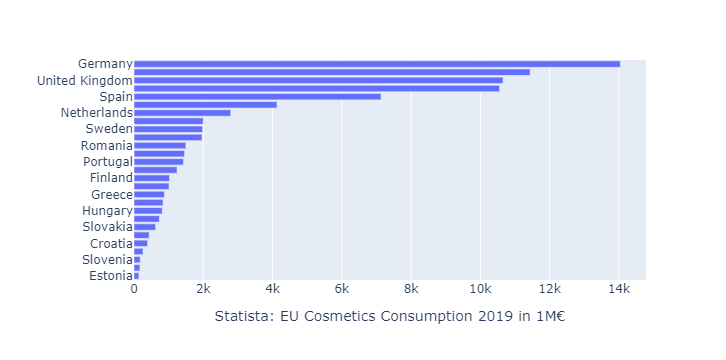

In [187]:
px.bar(
    pd.read_html(
        'https://www.statista.com/statistics/382100/european-cosmetics-market-volume-by-country/'
    )[0].sort_values('Consumption value in million euros', ascending=True),
    y = 'Characteristic', x = 'Consumption value in million euros', 
    labels = {
        'Characteristic':'', 
        'Consumption value in million euros':r'Statista: EU Cosmetics Consumption 2019 in 1M€'
    }, 
)

In [193]:
stat_cos_con19_df = pd.read_html(
    'https://www.statista.com/statistics/382100/european-cosmetics-market-volume-by-country/'
)[0].sort_values('Consumption value in million euros', ascending=False)
stat_cos_con19_df.columns = ['country', 'MEUR']

### Top EU countries in cosmetics 2019

In [194]:
stat_cos_con19_df[stat_cos_con19_df['MEUR'] >= 2e3]

,country,MEUR
0,Germany,14046
1,France,11439
2,United Kingdom,10657
3,Italy,10558
4,Spain,7134
5,Poland,4130
6,Netherlands,2795
7,Belgium/Luxembourg,2000


## Finanznachrichten Course for Cosmetics Companies

- Top cosmetics companies by volume

In [201]:
fin_comp_cos_df = pd.read_html('https://www.finanznachrichten.de/aktienkurse-branche/kosmetik.htm')[-1]

### main table

In [202]:
fin_comp_cos_df

,AktienWKN,Akt. KursVortag,Unnamed: 2,+/-%,Zeit,GeldStück,BriefStück,T.-HochT.-Tief,52-W-H52-W-T,Umsatz (Stück)Umsatz (Euro),News7 Tage,Unnamed: 11
0,BEIERSDORF AG520000 Xetra,1064010620,NaN,"+0,20+0,19 %",10:10,10620117,1063068,1066510610,108058186,"16.4361,7 Mio.",41,NaN
1,NATURA &CO HOLDING SA ADRA2PXU7 NASDAQ,2087020860,NaN,"+0,010+0,05 %",06.08.,168201,248501,2104020610,--,55.324878.281,3,NaN
2,YATSEN HOLDING LTD ADRA2QHK7 NASDAQ,68006600,NaN,"+0,200+3,03 %",06.08.,67002,685010,68456520,--,102.839584.396,-,NaN
3,CLOROX COMPANY856678 Tradegate,1381013825,NaN,"-0,15-0,11 %",09:53,1381535,1388540,1381013775,2038013450,24433.632,26,NaN
4,ESTEE LAUDER COMPANIES INC897933 Tradegate,2832027960,NaN,"+3,60+1,29 %",10:08,2786033,2833032,2839027850,2852016494,5615.730,-,NaN
5,REVLON INCA0Q9V1 Tradegate,105209920,NaN,"+0,600+6,05 %",06.08.,10080500,10120495,1052010300,155003500,8248.558,2,NaN
6,SHISEIDO CO LTD854002 Tradegate,56285508,NaN,"+1,20+2,18 %",05.08.,583086,596484,0,648044015,895.009,1,NaN
7,UNITED-GUARDIAN INC867399 NASDAQ,1534015910,NaN,"-0,570-3,58 %",06.08.,1510010,153503,1535015340,--,5604.447,-,NaN
8,ULTA BEAUTY INCA0M240 Tradegate,3012030010,NaN,"+1,10+0,37 %",08:00,3000031,3004030,3012030120,3010017218,3904,-,NaN
9,COTY INCA1WY6X Tradegate,72267318,NaN,"-0,092-1,26 %",09:04,7248690,7346681,72267226,87362252,17,1,NaN


### top companies' WKNs per volume

In [210]:
print(fin_comp_cos_df['AktienWKN'][:5])

0                     BEIERSDORF AG520000 Xetra
1        NATURA &CO HOLDING SA ADRA2PXU7 NASDAQ
2           YATSEN HOLDING LTD ADRA2QHK7 NASDAQ
3                CLOROX COMPANY856678 Tradegate
4    ESTEE LAUDER COMPANIES INC897933 Tradegate
Name: AktienWKN, dtype: object


### difficulties

- No time series
- **only actual situation** on stock market

## MarketWatch.com Stock Market Series

- selecting the 4 (US) from **top 5** cosmetic **companies** <span style="color:gray">(per stock market volume)</span>
    - Beiersdorf
    - Yansen
    - Clorox
    - Estee Lauder

In [286]:
stock_beiersdorf_df = pd.concat(list(map(
    lambda p: pd.read_csv(p), glob.glob('../data/marketwatch.com/BDRFF_US/*.csv')
)),0).sort_values('Date')

In [573]:
def marketwatch_prep(df: pd.DataFrame, gr_name='', cols=['Volume']) -> pd.DataFrame:
    df['Date'] = pd.to_datetime(df['Date'])
    df['Volume'] = np.array(list(map(
        lambda c: int(c.replace(',','')), df['Volume']
    )), dtype=int)
    df = df.sort_values('Date')
    df = df.set_index('Date')
    df = df[cols]
    if len(gr_name):
        df.columns = (df.columns + '_' + gr_name).str.replace(' ', '_')
    return df

In [558]:
def marketwatch_load(short: str) -> pd.DataFrame:
    return pd.concat([
                pd.read_csv(
                    f'https://www.marketwatch.com/investing/stock/{short}/downloaddatapartial?startdate=08/01/2020&enddate=07/31/2021&frequency=p1d&csvdownload=true&downloadpartial=false&newdates=false'
                ),
                pd.read_csv(
                    f'https://www.marketwatch.com/investing/stock/{short}/downloaddatapartial?startdate=08/01/2019&enddate=07/31/2020&frequency=p1d&csvdownload=true&downloadpartial=false&newdates=false'
                ),
            ],0)

In [569]:
marketwatch_ext_map = {
    'Clorox': 'clx', 
    'Estee Lauder': 'el',
    'Beiersdorf': 'bdrff', 
    'Yansen': 'ysg',
}

In [575]:
marketwatch_dfs = list(map(
    lambda com:
    marketwatch_prep(marketwatch_load(com[1]), gr_name=com[0]),
    list(marketwatch_ext_map.items())
))

In [576]:
marketwatch_df = reduce(
    lambda df1, df2:
    df1.join(df2, how='outer'),
    marketwatch_dfs
)

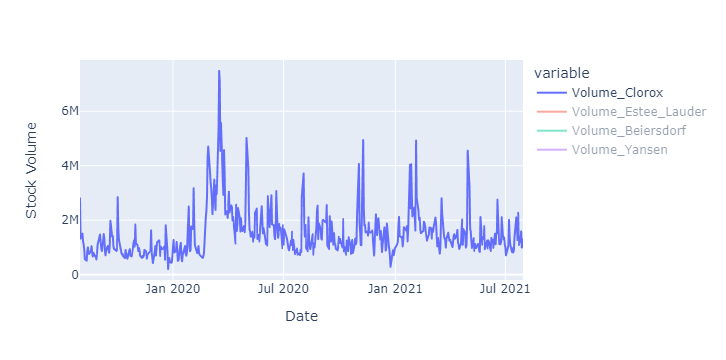

In [577]:
px.line(marketwatch_df, labels={'value':'Stock Volume'})

### monthly + reducing to valid data only

- Clorox
- Estee Lauder

In [581]:
marketwatch_red_df = marketwatch_df.iloc[:,:2]

In [582]:
marketwatch_red_mon_df = marketwatch_red_df.reset_index().sort_values('Date')
marketwatch_red_mon_df['M'] = marketwatch_red_mon_df['Date'].dt.strftime('%Y-M%m')
marketwatch_red_mon_df = marketwatch_red_mon_df.groupby('M').mean().iloc[2:]

In [583]:
marketwatch_red_mon_df.head(3)

,Volume_Clorox,Volume_Estee_Lauder
M,,
2019-M10,1.016132e+06,1.827548e+06
2019-M11,8.310103e+05,1.369825e+06
2019-M12,8.799499e+05,1.271932e+06


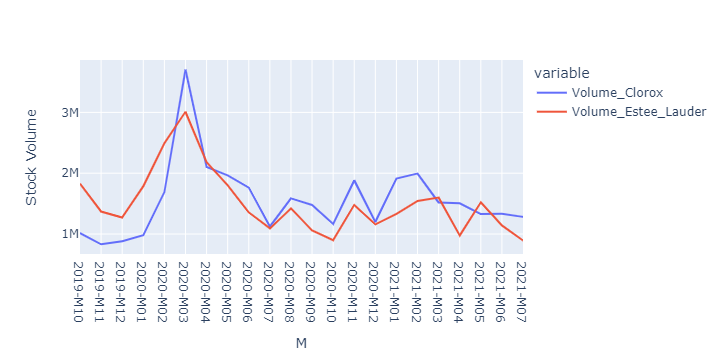

In [584]:
px.line(marketwatch_red_mon_df, labels={'value':'Stock Volume'})

## finanzen.net

- for non-valid stock volumes of marketwatch.net
    - Beiersdorf XETRA
    - Natura & Co (here using NYSE)

In [605]:
def prep_finet(df: pd.DataFrame, gr_name: str = '') -> pd.DataFrame:
    df = df.iloc[:,[0,-1]]
    df.columns = ['Date','Volume']
    df['Date'] = pd.to_datetime(df['Date'], format='%d.%m.%Y')
    df['Volume'] = df['Volume'].str.replace('.', '', regex=False).astype(int)
    if len(gr_name):
        vname = ('Volume'+'_'+gr_name).replace(' ','_')
    else:
        vname = 'Volume'
    df = df.rename(columns = {'Volume': vname}, inplace = False)
    return df.sort_values('Date', ascending=True).set_index('Date')

#### merging  stock volumes

In [606]:
finet_stock_beiersdorf_df = prep_finet(
    pd.read_csv('../data/finanzen.net/beiersdorf_xetra_hist.tsv', sep='\t'), 
    gr_name = 'Beiersdorf'
)

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [611]:
finet_stock_natura_df = prep_finet(
    pd.read_csv('../data/finanzen.net/natura_nyse_hist.tsv', sep='\t'), 
    gr_name = 'Natura&Co_SE'
)

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [631]:
finet_stock_df = finet_stock_beiersdorf_df.join(finet_stock_natura_df, how='outer')

#### interpolation

- **cubic** (mainly good for TimeSeries)


In [681]:
def fill_date_range(df, start='10/01/2019', end='07/31/2021', freq='D'):
    return pd.DataFrame(
        pd.date_range(
            start, 
            end, 
            freq=freq
        ),
        columns = ['Date']
    ).set_index('Date').join(df, how='left')

In [682]:
finet_stock_df = fill_date_range(finet_stock_df)

In [683]:
finet_stock_df = finet_stock_df.interpolate('cubic')

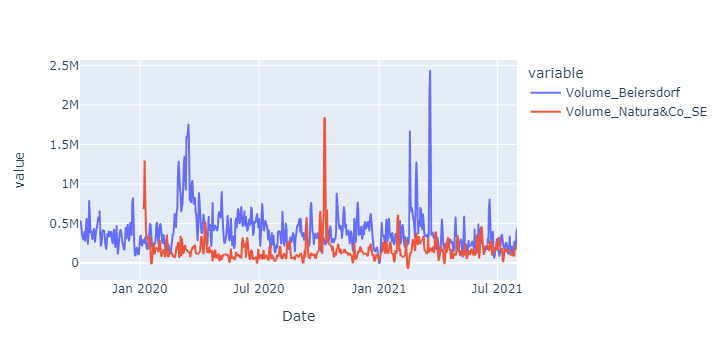

In [684]:
px.line(finet_stock_df)

### monthly

In [637]:
finet_stock_mon_df = finet_stock_df.reset_index()
finet_stock_mon_df['M'] = finet_stock_mon_df['Date'].dt.strftime('%Y-M%m')
finet_stock_mon_df = finet_stock_mon_df.groupby('M').mean().iloc[:-1]

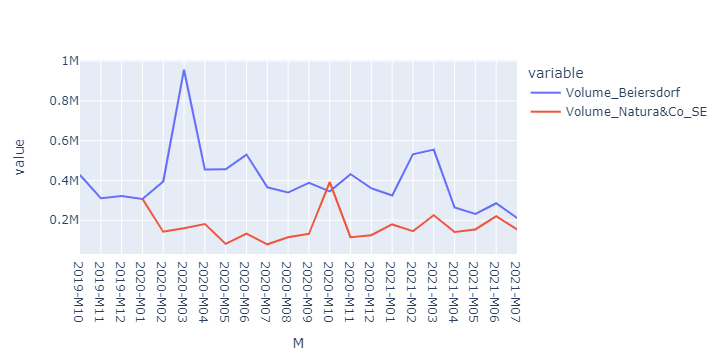

In [638]:
px.line(finet_stock_mon_df)

## MarketWatch + Finanzen.net

- simple merge
- monthly resolution

In [639]:
stock_mon_df = finet_stock_mon_df.join(marketwatch_red_mon_df, how='outer')

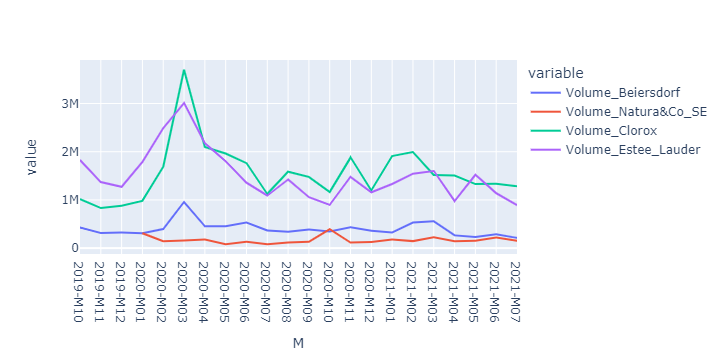

In [640]:
px.line(stock_mon_df)

In [981]:
X_stock = stock_mon_df

## Trade Map

### Make-Up and Skin

#### Monthly resolution

In [9]:
trmp_imp_makeupskin_df = pd.read_csv('../data/trademap/imp_makeupskin_monthly.tsv', sep='\t').iloc[:,:-1]

In [10]:
trmp_imp_makeupskin_df.head()

,Importers,Imported value in 2019-M11,Imported value in 2019-M12,Imported value in 2020-M01,Imported value in 2020-M02,Imported value in 2020-M03,Imported value in 2020-M04,Imported value in 2020-M05,Imported value in 2020-M06,Imported value in 2020-M07,...,Imported value in 2020-M09,Imported value in 2020-M10,Imported value in 2020-M11,Imported value in 2020-M12,Imported value in 2021-M01,Imported value in 2021-M02,Imported value in 2021-M03,Imported value in 2021-M04,Imported value in 2021-M05,Imported value in 2021-M06
0,Japan,120041.0,133340.0,133677.0,107176.0,122233.0,113297.0,106081.0,97301.0,109177.0,...,132022.0,116440.0,122586.0,126599.0,112825.0,118314.0,130858.0,144144.0,125320.0,126123.0
1,"Korea, Republic of",82158.0,91227.0,86976.0,84939.0,80232.0,71326.0,54392.0,61654.0,72430.0,...,72557.0,74362.0,75588.0,79532.0,73172.0,67998.0,79239.0,75392.0,75563.0,74097.0
2,Switzerland,41901.0,37436.0,41825.0,38448.0,44199.0,38050.0,39342.0,45018.0,42142.0,...,48403.0,54436.0,51357.0,47947.0,49282.0,50048.0,57112.0,49577.0,52329.0,50944.0
3,Norway,19945.0,22381.0,20875.0,22059.0,22157.0,19204.0,21404.0,28195.0,25381.0,...,29049.0,31601.0,30162.0,28259.0,24240.0,31426.0,37589.0,29957.0,34435.0,36698.0
4,New Zealand,20626.0,20194.0,15336.0,13608.0,12789.0,8083.0,10685.0,13677.0,17307.0,...,18830.0,22502.0,23121.0,22936.0,17712.0,17132.0,16892.0,18743.0,19852.0,18452.0


In [11]:
tname='M' # we are looking at monthly resolution here
vname='import' # we are lookin at imports here

In [12]:
def flatten_trmp(df, vname=None, tname='M'):
    df.columns = ['country'] + list(df.columns[1:])
    def flat_col(col):
        df_ = pd.DataFrame()
        df_['values'] = col
        df_['country'] = col.name
        return df_
    df = pd.concat(list(map(
        lambda c: 
        flat_col(df.set_index('country').T[c]), 
        df.set_index('country').T.columns
    )),0).reset_index()
    if not vname:
        vname = 'value'
    df.columns = [tname, vname, 'country']
    df[tname] = df[tname].str.replace('^.+ value in ', '', regex=True)
    return df

In [13]:
trmp_imp_makeupskin_flt_df = flatten_trmp(trmp_imp_makeupskin_df, vname=vname, tname=tname)

In [163]:
trmp_imp_makeupskin_flt_df.set_index([tname,'country']).sample(5)

,,import
M,country,
2020-M11,United Arab Emirates,NaN
2020-M01,Mauritius,940.0
2020-M07,Brazil,13505.0
2020-M10,Austria,42679.0
2020-M01,Ecuador,8479.0


In [16]:
dfs = list(map(
    lambda s: flatten_trmp(pd.read_csv(f'../data/trademap/{s[:3]}_makeupskin_monthly.tsv', sep='\t').iloc[:,:-1], s), 
    ['import','export', 'balance']
))

In [17]:
for df in dfs:
    print(df['country'].unique().shape)

(113,)
(110,)
(113,)


In [134]:
trmp_makeupskin_flt_df = reduce(lambda df1, df2: df1.merge(df2, on=['M','country']), dfs)

In [135]:
trmp_makeupskin_flt_df

,M,import,country,export,balance
0,2019-M11,120041.0,Japan,340843.0,220802.0
1,2019-M12,133340.0,Japan,386602.0,253262.0
2,2020-M01,133677.0,Japan,262465.0,128788.0
3,2020-M02,107176.0,Japan,343939.0,236763.0
4,2020-M03,122233.0,Japan,400208.0,277975.0
...,...,...,...,...,...
2415,2021-M04,NaN,Zambia,NaN,NaN
2416,2021-M05,NaN,Zambia,NaN,NaN
2417,2021-M06,NaN,Zambia,NaN,NaN
2418,2021-M06,NaN,Zambia,NaN,NaN


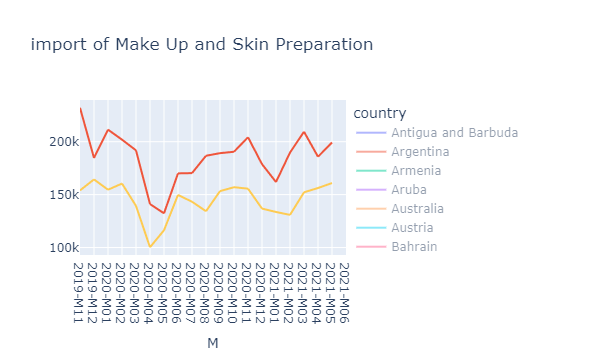

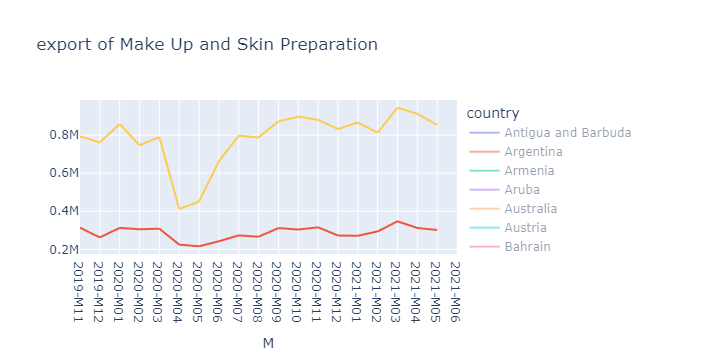

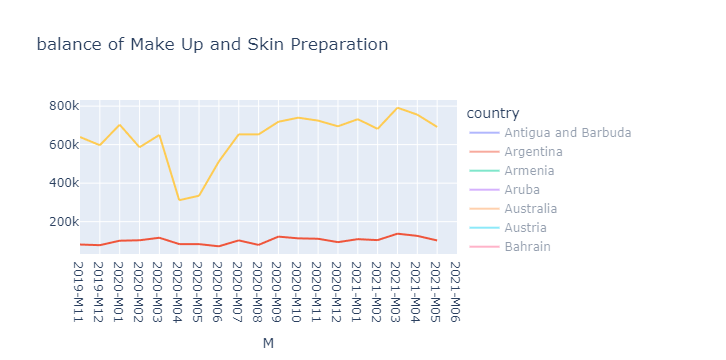

In [339]:
for kpi in ['import','export', 'balance']:
    fig = px.line(
        trmp_makeupskin_flt_df.sort_values([tname,'country']), tname, kpi, color='country', 
        title=f'{kpi} of Make Up and Skin Preparation', 
        labels={kpi:''}, 
    )
    plyo.iplot(fig)

- valleys at beginning of COVID19

In [21]:
trmp_makeupskin_flt_df[
    trmp_makeupskin_flt_df['country']=='Germany'
].corr()

,import,export,balance
import,1.000000,0.863959,0.314608
export,0.863959,1.000000,0.749801
balance,0.314608,0.749801,1.000000


### creating dependent variables

for each:
- country
    - import
    - export
    - balance

In [349]:
def get_trmp_coutry_pivot(kpi: str) -> df:
    df = trmp_makeupskin_flt_df.pivot_table(
        index='M', columns='country', values=kpi, dropna=False,
    )
    df.columns = df.columns + '_' + kpi
    return df

In [354]:
trmp_pivot_dfs = list(map(lambda kpi: get_trmp_coutry_pivot(kpi), ['import', 'export', 'balance']))

In [355]:
for df in trmp_pivot_dfs:
    print(df.shape)

(20, 110)
(20, 110)
(20, 110)


In [356]:
X_trmp = reduce(
    lambda c1, c2: c1.join(c2), 
    trmp_pivot_dfs
)

In [358]:
X_trmp_corr = X_trmp.corr()

In [366]:
plt.figure(figsize=(180,100))
sns.heatmap(X_trmp_corr)
plt.xlabel('')
plt.ylabel('')

Text(1598.09375, 0.5, '')

#### German Export 80% Pearson correlation (without shifting)

In [378]:
X_trmp_corr['Germany_export'][X_trmp_corr['Germany_export']>.8].sort_values(ascending=False)

country
Israel_balance                 1.000000
Honduras_import                1.000000
Samoa_import                   1.000000
Saint Lucia_import             1.000000
Germany_export                 1.000000
Palestine, State of_import     1.000000
Guatemala_export               1.000000
Honduras_export                1.000000
Saint Lucia_export             1.000000
Guatemala_import               1.000000
Dominica_import                1.000000
Antigua and Barbuda_balance    1.000000
Bermuda_balance                1.000000
Brazil_import                  0.893323
Zambia_import                  0.887677
Peru_import                    0.873202
Germany_import                 0.863959
Spain_export                   0.850074
Canada_export                  0.849600
France_export                  0.842592
Aruba_import                   0.840049
Kenya_import                   0.839139
Italy_import                   0.833877
France_balance                 0.830572
Romania_import                 0

- **different countries'** are **highly correlated** mostly in **imports** and **exports** 
- not necessarily causal

#### Condensing to top EU countries in cosmetics market 2019

Top 7 according to Statista:
 - Germany
 - France
 - United Kingdom
 - Italy
 - Spain
 - Poland
 - Netherlands
 - Belgium/Luxembourg

In [391]:
eu_top_countries = list(stat_cos_con19_df[stat_cos_con19_df['MEUR'] >= 2e3]['country'])

In [ ]:
list(map(
                lambda eu:
                    c.startswith[eu], 
                    eu_top_countries
            ))

In [406]:
X_trmp_eu_top = X_trmp[
    list(filter(
        lambda c: sum(
            list(map(
                lambda eu:
                    c.startswith(eu), 
                    eu_top_countries
            ))
        )>0,
        np.array(X_trmp.columns, dtype=str)
    ))
]

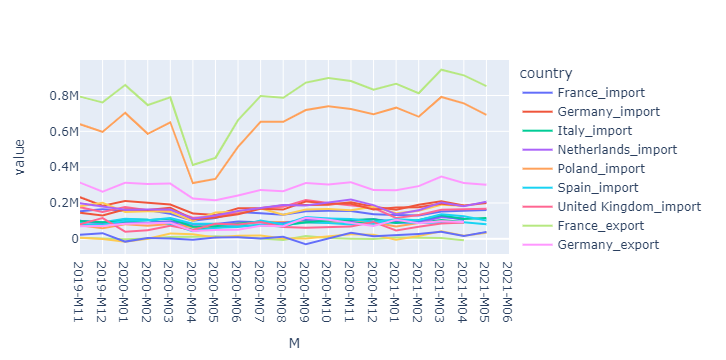

In [409]:
px.line(X_trmp_eu_top)

#### more than 80% Pearson correlation

<AxesSubplot:xlabel='country', ylabel='country'>

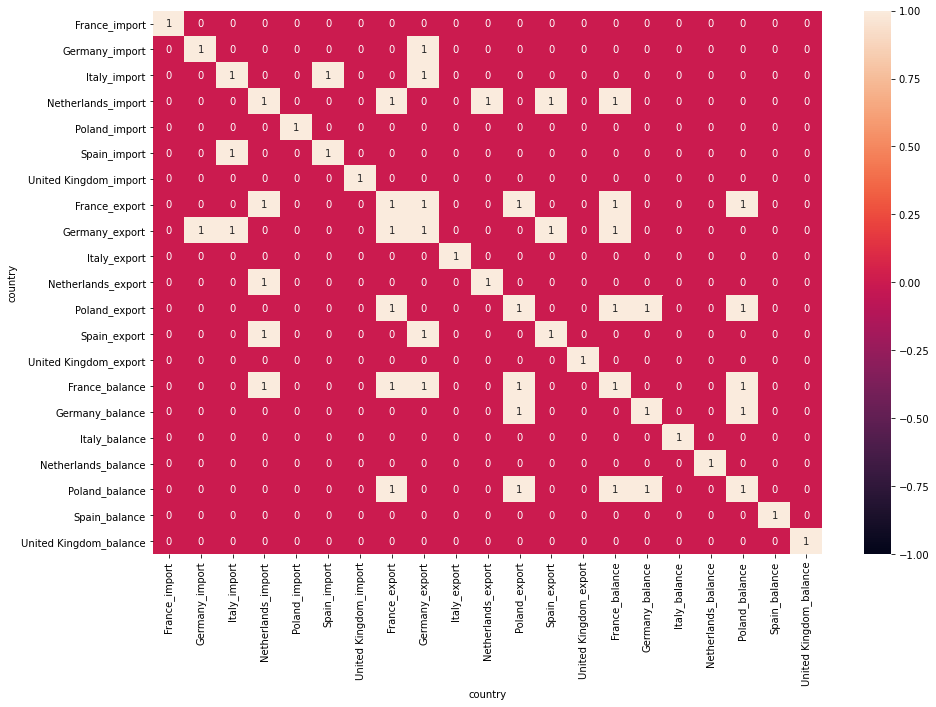

In [697]:
plt.figure(figsize=(15,10))
sns.heatmap(abs(X_trmp_eu_top.corr())>.8, vmin=-1, vmax=1, annot=True)

- there are few correlations (as expected)

In [963]:
X_trade = X_trmp_eu_top

# Covid19 Independent Variable Data

Here we take a look into certain COVID19 KPIs.

- monthly cumulative cases for each country

We will decode the data into the following numbers:

- no. cases per million at time *t*
- reproduction rate at time *t*
- no. deaths permillion (due to Covid19) at time *t*
- no. vaccination permillion (due to Covid19) at time *t*

## Our World in Data table

Data from [Our World in Data](https://ourworldindata.org/coronavirus).

The Data contains a large list of metrics:

In [141]:
pd.read_html('https://github.com/owid/covid-19-data/tree/master/public/data/')[0]

,Metrics,Source,Updated,Countries
0,Vaccinations,Official data collated by the Our World in Dat...,Daily,214
1,Tests & positivity,Official data collated by the Our World in Dat...,Weekly,136
2,Hospital & ICU,Official data collated by the Our World in Dat...,Weekly,34
3,Confirmed cases,JHU CSSE COVID-19 Data,Daily,194
4,Confirmed deaths,JHU CSSE COVID-19 Data,Daily,194
5,Reproduction rate,"Arroyo-Marioli F, Bullano F, Kucinskas S, Rond...",Daily,184
6,Policy responses,Oxford COVID-19 Government Response Tracker,Daily,186
7,Other variables of interest,"International organizations (UN, World Bank, O...",Fixed,240


The most important ones are:

- infetions (new cases / month)
- death (mortality)
- reproduction rate
- maybe vaccinations (due to the political and economical influence of this number)

In [139]:
cov19_owid_df = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv')

In [140]:
cov19_owid_df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107892,ZWE,Africa,Zimbabwe,2021-08-03,112435.0,1580.0,1532.000,3676.0,41.0,56.571,...,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN
107893,ZWE,Africa,Zimbabwe,2021-08-04,113526.0,1091.0,1422.714,3711.0,35.0,53.000,...,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN
107894,ZWE,Africa,Zimbabwe,2021-08-05,114489.0,963.0,1261.857,3754.0,43.0,47.571,...,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN
107895,ZWE,Africa,Zimbabwe,2021-08-06,115445.0,956.0,1136.429,3805.0,51.0,45.000,...,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN


In [143]:
cov19_owid_country_df = cov19_owid_df.groupby(['date', 'location']).sum()

In [145]:
cov19_owid_country_df.columns

Index(['total_cases', 'new_cases', 'new_cases_smoothed', 'total_deaths',
       'new_deaths', 'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'new_vaccinations',
       'new_vaccinations_smoothed', 'total_vaccinations_per_hundred',
       'people_vaccinated_per_hundred', 'people_fully_vaccin

In [148]:
use_cols = [
    'new_cases_smoothed_per_million',
    'new_deaths_smoothed_per_million',
    'new_vaccinations_smoothed_per_million',
    'reproduction_rate',
]

### countries overlapping with trade market data

In [203]:
ov_countries = np.array(list(filter(
    lambda c: c in cov19_owid_country_df.reset_index()['location'].unique(), 
    trmp_makeupskin_flt_df['country'].unique()
)))
ov_countries

array(['Japan', 'Switzerland', 'Norway', 'New Zealand', 'Brazil',
       'Argentina', 'Bahrain', 'Iceland', 'Georgia', 'Barbados',
       'Madagascar', 'Malawi', 'Malaysia', 'Malta', 'Mauritania',
       'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Netherlands',
       'Aruba', 'Indonesia', 'Ireland', 'Israel', 'Italy', 'Kyrgyzstan',
       'Latvia', 'Lithuania', 'Luxembourg', 'Pakistan', 'Paraguay',
       'Peru', 'Philippines', 'Poland', 'Portugal', 'Romania',
       'Saint Lucia', 'Saint Vincent and the Grenadines', 'Senegal',
       'Serbia', 'Seychelles', 'India', 'Singapore', 'Slovakia',
       'Slovenia', 'South Africa', 'Spain', 'Eswatini', 'Sweden',
       'Belgium', 'Bermuda', 'Bosnia and Herzegovina', 'Armenia',
       'Australia', 'Austria', 'Germany', 'Greece', 'Guatemala', 'Guyana',
       'Honduras', 'Hungary', 'Belize', 'Bulgaria', 'Burundi', 'Cambodia',
       'Canada', 'Chile', 'China', 'Colombia', 'Congo', 'Costa Rica',
       'Croatia', 'Cyprus', 'Benin', 'Denm

### visualization

In [647]:
def cov19_owid_choose_countries(df, countries=eu_top_countries):
    df = df.reset_index().set_index('date')
    return df[list(map(
        lambda l: l in countries, df['location']
    ))]

In [648]:
cov19_owid_eutop_df = cov19_owid_choose_countries(cov19_owid_country_df)

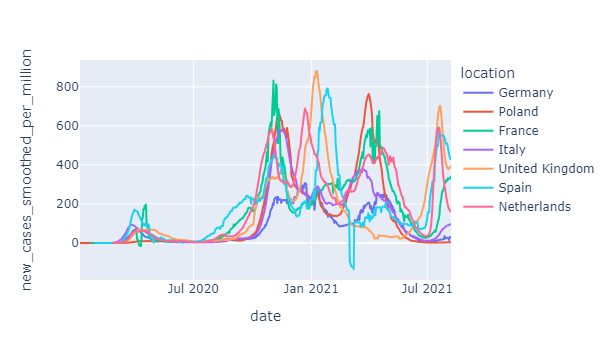

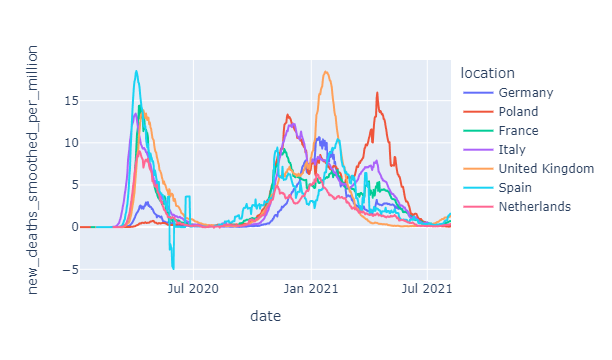

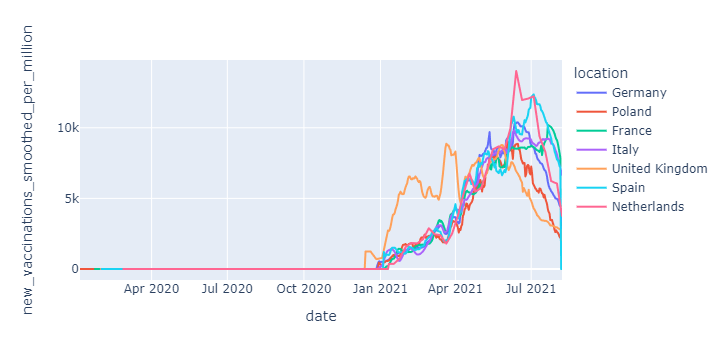

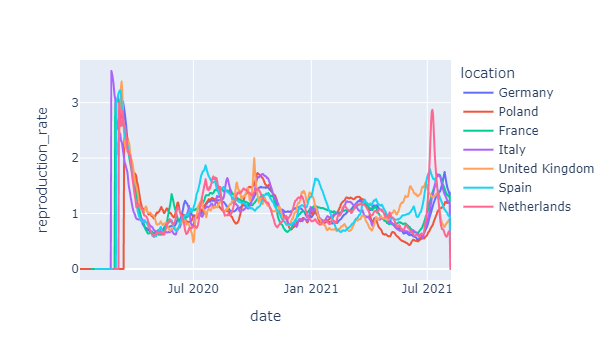

In [649]:
for col in use_cols:
    df_ = cov19_owid_eutop_df.loc[:,['location', col]]
    plyo.iplot(px.line(df_, y=col, color='location'))

### wide format

In [655]:
def get_pivoted_kpi_by_col(df, col:str, idx:str, kpi: str) -> df:
    df = df.reset_index().pivot_table(
        index=idx, columns=col, values=kpi, dropna=False,
    )
    df.columns = df.columns + '_' + kpi
    return df

In [657]:
cov19_owid_eutop_pivot_dfs = list(map(
    lambda kpi: get_pivoted_kpi_by_col(
        cov19_owid_eutop_df, 
        'location', 
        'date', 
        kpi
    ), 
    use_cols
))

In [698]:
cov19_owid_eutop_wde_df = reduce(
    lambda c1, c2: c1.join(c2, how='outer'), 
    cov19_owid_eutop_pivot_dfs
).fillna(0)

In [699]:
cov19_owid_eutop_wde_df.head(3)

location,France_new_cases_smoothed_per_million,Germany_new_cases_smoothed_per_million,Italy_new_cases_smoothed_per_million,Netherlands_new_cases_smoothed_per_million,Poland_new_cases_smoothed_per_million,Spain_new_cases_smoothed_per_million,United Kingdom_new_cases_smoothed_per_million,France_new_deaths_smoothed_per_million,Germany_new_deaths_smoothed_per_million,Italy_new_deaths_smoothed_per_million,...,Poland_new_vaccinations_smoothed_per_million,Spain_new_vaccinations_smoothed_per_million,United Kingdom_new_vaccinations_smoothed_per_million,France_reproduction_rate,Germany_reproduction_rate,Italy_reproduction_rate,Netherlands_reproduction_rate,Poland_reproduction_rate,Spain_reproduction_rate,United Kingdom_reproduction_rate
date,,,,,,,,,,,,,,,,,,,,,
2020-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-01-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### eliminating negative case reportings

- setting all negative case values to NaN
- interpolating them with cubic

Difficulties

- trying to only interpolate in positive realm

In [700]:
cov19_owid_eutop_wde_df[cov19_owid_eutop_wde_df<0] = np.NaN

In [701]:
cov19_owid_eutop_wde_df.index = pd.to_datetime(cov19_owid_eutop_wde_df.index)

In [702]:
cov19_owid_eutop_wde_df = fill_date_range(cov19_owid_eutop_wde_df)

In [703]:
cov19_owid_eutop_wde_df = cov19_owid_eutop_wde_df.interpolate('cubic')

In [807]:
cov19_owid_eutop_wde_df[cov19_owid_eutop_wde_df<0] = 0

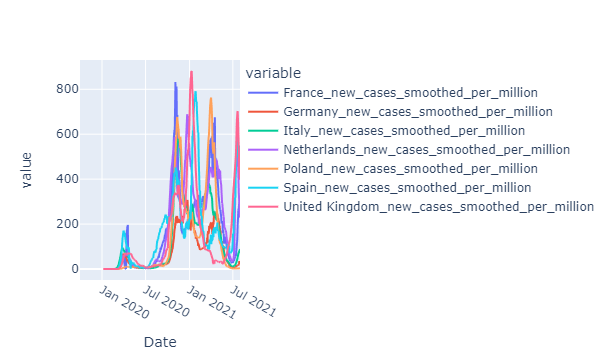

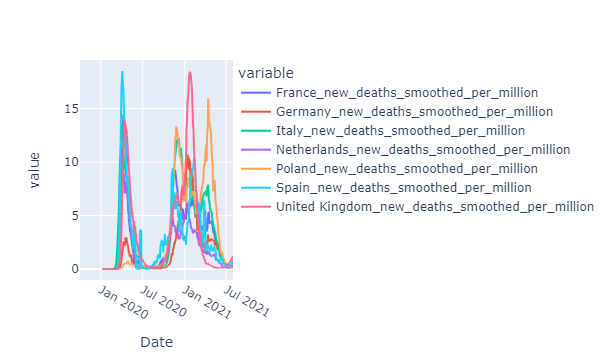

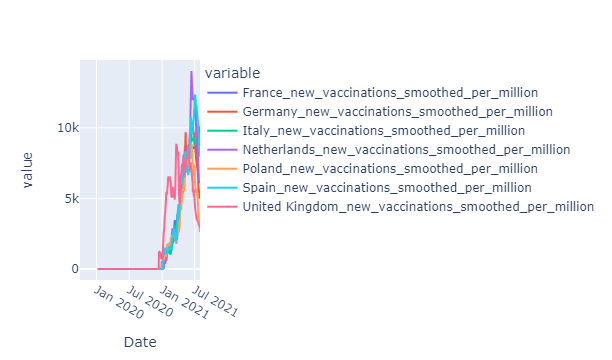

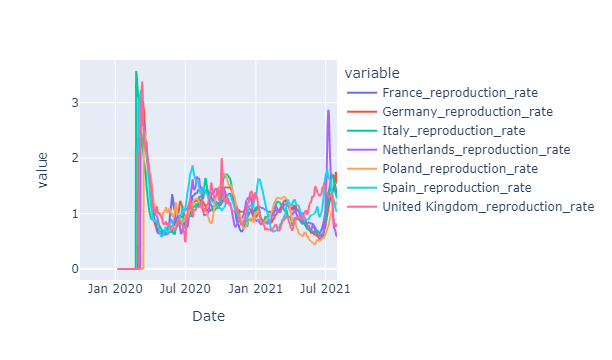

In [808]:
for kpi in use_cols:
    px.line(
        cov19_owid_eutop_wde_df.loc[:,list(map(
            lambda c: kpi in c,
            cov19_owid_eutop_wde_df.columns
        ))]
    ).show()

### build monthly independent variables

In [812]:
cov19_owid_eutop_mon_df = cov19_owid_eutop_wde_df.reset_index()
cov19_owid_eutop_mon_df['M'] = cov19_owid_eutop_mon_df['Date'].dt.strftime('%Y-M%m')
cov19_owid_eutop_mon_df = cov19_owid_eutop_mon_df.groupby('M').mean()

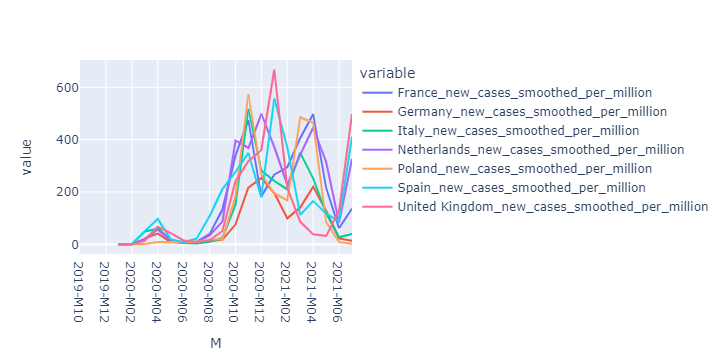

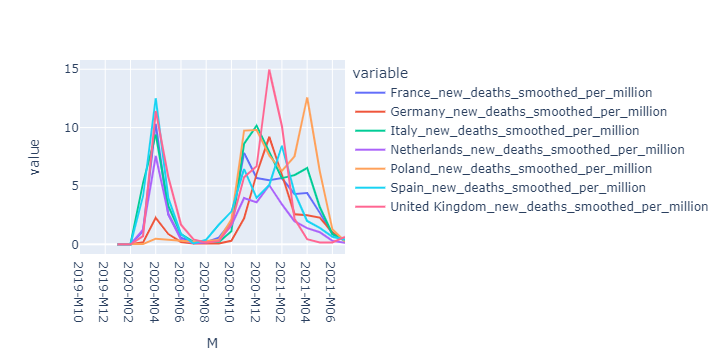

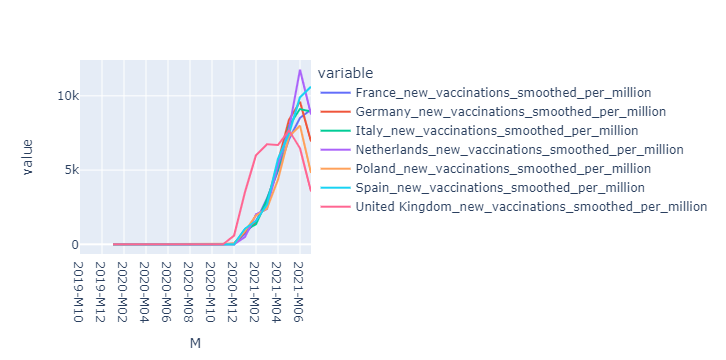

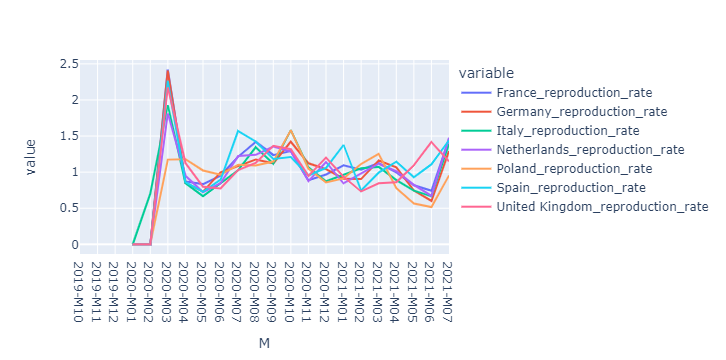

In [814]:
for kpi in use_cols:
    px.line(
        cov19_owid_eutop_mon_df.loc[:,list(map(
            lambda c: kpi in c,
            cov19_owid_eutop_wde_df.columns
        ))]
    ).show()

In [980]:
X_cov19 = cov19_owid_eutop_mon_df

In [982]:
X_stock_ = X_stock
X_cov19_ = X_cov19

# Model Inference

Due to 
- collected data
- thoughts on sepcific causalities

Use of following approach
- a causal graph
    - linear
        - non-linear transformations
            - SciKit-optimize

Dependencies may be:


Covid19 -> Trade Data -> Stock Market<br>
Covid19 -> Stock Market<br>

<span style="color:grey">Stock Market -> Trade Data</span>

**last ignored** due to
- pragmatism
- does not represent specific company / stock values

**Normally stock market and trade data influence each other and Corona is a latent variable!**

*But then the graph would not be causal anymore.*

## tranformations

- convolution (delay-retention triangle)
- response curve (kinda sigmoid)

### convolution

- stationary time series modelling
- smoothens time dependencies
    - retention and delay
        - Bayesian Parameter Optimization
- **retention usually autoregressive** (not here at the moment)

In [936]:
def conv_var(var, delay, retention):
    h = np.hstack([
            np.linspace(0,1,np.round(delay).astype(int)), # linear delay
            np.linspace(1,0,np.round(retention).astype(int))[1:] # non-autoregressive retension
    ])
    if len(h) < 1:
        h = 1
    # we cut the result to the length out our ts
    return np.convolve(var, h, mode='full')[:len(var)]

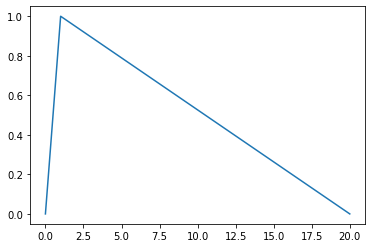

In [905]:
delay = 2
retention = 20
h = np.hstack([
            np.linspace(0,1,np.round(delay).astype(int)),
            np.linspace(1,0,np.round(retention).astype(int))[1:]
    ])
plt.plot(h)

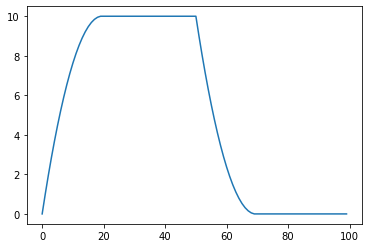

In [906]:
plt.plot(conv_var(
    np.ones(50).tolist() + np.zeros(50).tolist(), 
    2, 20
))

### sigmoid

$logit(x) = \frac{1}{1+exp\left(-k (x - m)\right)}$ <br>
$k$ ... rate <br>
$m$ ... mid-point

- inspired by the [Sigmoidal Programming](chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/viewer.html?pdfurl=https%3A%2F%2Fstanford.edu%2F~boyd%2Fpapers%2Fpdf%2Fmax_sum_sigmoids_slides.pdf&clen=924863&chunk=true)
- automatically scales the variables i.t.o. effect
- has to be optimized
    - i.e. Byesian Parameter Optimization

In [752]:
def logit_var(var, r, m):
    return 1 / (1 + np.exp(-r*(var-m)))

In [753]:
def weibull_var(var, scale, shape):
    return 1 - np.exp(-((var/scale)**shape))

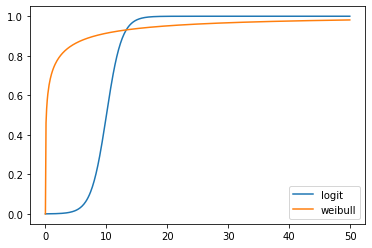

In [759]:
x = np.arange(-0,50,.1)
plt.plot(x, logit_var(x, r=.8, m=10))
plt.plot(x, weibull_var(x, scale=.5, shape=.3))
plt.legend(['logit','weibull'])

- logit for simplicity

### sub-lineal model

Ridge

$argmax_{\beta}\left(||y-\beta V + b||_2^2 + ||\beta||_2^2\right)$

- for simplicity
- smooth variable inclusion

non-linear transform

$V = logit(X \circledast H, X_{mid}, rate)$<br>
$H[0<t<=delay] = \frac{1}{delay} t$ <br>
$H[delay<t<retention] = 1 - \frac{1}{retention} t$


Assume

- graph from model introduction
- c, t, s ... Covid19, trade, stock

Final condensed model:

$p(c|t,s) = \frac{p(s|t,c)p(t)p(t|c)p(c) }{ \sum_{t',c'}p(s|t',c')p(t')p(t|c')p(c')}$<br>
$p(c|t,s) = \frac{p(s|t,c)p(t)p(t,c) }{ \sum_{t', c'}p(s|t',c')p(t')p(t',c')}$<br>
$p(c|t,s) = \frac{p(s|t,c)p(t) }{ \sum_{t'}(p(s|t',c)p(t'))}$<br>

From exponential family:

$c|t,s = s|t,c + t|c$<br>
$x|y = \beta(x|y) = \beta(x|f(x))$

In [999]:
class tr_reg_model_wrapper(object):
    '''Model wrapper for Transformed Linear Regression
    
    Transformations of inputs are
        - 2-parameter convolution function
        - 2-parameter response
    
    each individual.
    '''
    def __init__(
        self, 
        model, 
        n_input,
        n_output,
        conv = conv_var, 
        resp = logit_var, 
        c1_range = [0,2], 
        c2_range = [0,6],
        r1_range = [.1,1.98],
        r2_range = [.1,2]
    ):
        self.conv = conv
        self.resp = resp
        self.model = model
        self.c1 = [Integer(*c1_range, name=f'c1_{i}') for i in range(n_input)]
        self.c2 = [Integer(*c1_range, name=f'c1_{i}') for i in range(n_input)]
        self.r1 = [Real(*r1_range, "log-uniform", name=f'r1_{i}') for i in range(n_input)]
        self.r2 = [Real(*r2_range, "log-uniform", name=f'r2_{i}') for i in range(n_input)]
        self.space_opt = None
        self.score = 0
        self.K = n_input
        self.D = n_output
        self.w_col = list(range(self.D))
        self.w_idx = list(range(self.K))
    
    def transform_x(self, x, params):
        
        if isinstance(x, pd.DataFrame):
            x = x.values
        
        params = np.array(params).reshape(-1,4)
        
        if len(params) < x.shape[1]:
            # repeat last params if some are missing
            params = np.vstack([
                params,
                np.ones((x.shape[1]-len(params),2))*params[-1]
            ])
        return np.concatenate(list(map(
            lambda j: self.resp(
                self.conv(x[:,j].reshape(-1), params[j,0], params[j,1]), 
                params[j,2], params[j,3]
            )[:,None],
            range(self.K)
        )), 1)
    
    def fit(self, x, y, n_iter):
        
        # parse non-array inputs
        if isinstance(y, pd.DataFrame):
            self.w_col = y.columns
            y = y.values
        if isinstance(x, pd.DataFrame):
            self.w_idx = x.columns
            x = x.values
        
        space  = self.c1 + self.c2 + self.r1 + self.r2
        
        #@use_named_args(x,y,space)
        def objective(x, y, params):
            
            params = np.array(params).reshape(-1,4)
            
            x = self.transform_x(x, params)
            self.model = self.model.fit(x, y)
            return -self.model.score(x, y)
        
        opt_res = gp_minimize(partial(objective, x, y), space, n_calls=n_iter, random_state=0, n_jobs=-1)
        
        self.space_opt = np.array(opt_res.x).reshape(self.K,4)
        self.score = opt_res.fun
        
        self.model = self.model.fit(self.transform_x(x, self.space_opt), y)
        
        return self
    
    def predict(self, x):
        
        assert not isinstance(self.space_opt, type(None))
        
        return self.model.predict(self.transform_x(x, self.space_opt), y)
    
    def predict_proba(self, x):
        
        assert not isinstance(self.space_opt, type(None))
        
        return self.model.predict_proba(self.transform_x(x, self.space_opt), y)
        
    def get_params(self):
        
        return self.space_opt + self.model.get_params
    
    def set_params(self, params):
        
        p_space = {k:params[k] for k in self.space_opt.keys}
        m_space = {k:params[k] for k in self.model.get_params().keys}
        
        self.model = self.model.set_params(m_space)
        self.space_opt = p_space
        
        return self
    
    def get_coefs(self):
        
        if hasattr(self.model, 'coef_'):
            return pd.DataFrame(
                self.model.coef_.T,
                index = self.w_idx,
                columns = self.w_col
            )
        else:
            return None
        

#### all X the same length

In [1000]:
print(X_trade.index[[0,-1]])
print(X_stock.index[[0,-1]])
print(X_cov19.index[[0,-1]])

Index(['2019-M11', '2021-M06'], dtype='object', name='M')
Index(['2019-M11', '2021-M06'], dtype='object', name='M')
Index(['2019-M11', '2021-M06'], dtype='object', name='M')


In [1001]:
X_stock = X_stock_.iloc[1:-1]
X_cov19 = X_cov19_.iloc[1:-1]

**OOPS : p > n  . . . :-/**

In [1002]:
print(X_trade.shape)
print(X_stock.shape)
print(X_cov19.shape)

(20, 21)
(20, 4)
(20, 28)


#### models

##### Covid19 -> trade

In [ ]:
model_cov19_trade = tr_reg_model_wrapper(
    Ridge(alpha=.98),  # lower penalty due to non-correlated variables
    X_cov19.shape[1], 
    X_trade.shape[1]
)

In [1005]:
model_cov19_trade = model_cov19_trade.fit(
    X_cov19.fillna(0), 
    X_trade.fillna(0), 
    60
)

In [1006]:
model_cov19_trade.get_coefs()

country,France_import,Germany_import,Italy_import,Netherlands_import,Poland_import,Spain_import,United Kingdom_import,France_export,Germany_export,Italy_export,...,Poland_export,Spain_export,United Kingdom_export,France_balance,Germany_balance,Italy_balance,Netherlands_balance,Poland_balance,Spain_balance,United Kingdom_balance
France_new_cases_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Germany_new_cases_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Italy_new_cases_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Netherlands_new_cases_smoothed_per_million,-7.177370e+03,-1.628402e+04,-4.728053e+03,8.910881e+02,6.069116e+03,-9.556509e+03,7.152129e+03,-2.182643e+04,-2.052828e+04,-7.433866e+03,...,5.944638e+03,-1.173462e+04,1.707184e+03,-1.464906e+04,-4.244264e+03,-2.705813e+03,-7.473786e+02,-1.244781e+02,-2.178108e+03,-5.444945e+03
Poland_new_cases_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Spain_new_cases_smoothed_per_million,3.231174e-27,2.019484e-28,5.250658e-27,3.029226e-27,3.635071e-27,9.087678e-28,-2.019484e-28,4.846761e-27,1.413639e-26,8.683781e-27,...,1.029937e-26,1.009742e-27,3.433123e-27,4.846761e-27,4.644813e-27,4.139942e-27,3.502542e-28,3.534097e-27,-4.038968e-28,-1.262177e-28
United Kingdom_new_cases_smoothed_per_million,-1.531309e+04,-2.312549e+04,-1.903604e+04,-9.604686e+03,-3.983911e+01,-1.565934e+04,-3.675309e+03,-5.232731e+04,-2.592012e+04,-2.507730e+04,...,-6.704332e+03,-8.977754e+03,-1.008017e+04,-3.701423e+04,-2.794635e+03,-6.041261e+03,7.594996e+02,-6.664493e+03,6.681588e+03,-6.404857e+03
France_new_deaths_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Germany_new_deaths_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Italy_new_deaths_smoothed_per_million,-1.765911e+04,-2.899384e+04,-2.017144e+04,-1.424313e+04,-1.059903e+04,-1.883276e+04,-3.877760e+04,-1.969653e+05,-4.682915e+04,-1.781198e+04,...,-4.199256e+04,-1.276082e+04,-3.384896e+04,-1.793062e+05,-1.783531e+04,2.359457e+03,3.383284e+03,-3.139353e+04,6.071941e+03,4.928631e+03


- r-rate has sometimes positive impact
- cases and death have sometimes positive impact

--> Manual Vriable Reduction

In [1020]:
X_cov19_red = X_cov19[list(filter(
    lambda col: all(list(map(
        lambda kpi: kpi not in col,
        ['reproduction', 'vaccination']
    ))),
    X_cov19.columns
))]

In [1021]:
model_cov19_trade = tr_reg_model_wrapper(
    Ridge(alpha=.98),  # lower penalty due to non-correlated variables
    X_cov19_red.shape[1], 
    X_trade.shape[1]
)

In [1022]:
model_cov19_trade = model_cov19_trade.fit(
    X_cov19_red.fillna(0), 
    X_trade.fillna(0), 
    60
)

In [1023]:
model_cov19_trade.get_coefs()

country,France_import,Germany_import,Italy_import,Netherlands_import,Poland_import,Spain_import,United Kingdom_import,France_export,Germany_export,Italy_export,...,Poland_export,Spain_export,United Kingdom_export,France_balance,Germany_balance,Italy_balance,Netherlands_balance,Poland_balance,Spain_balance,United Kingdom_balance
France_new_cases_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Germany_new_cases_smoothed_per_million,-7.634889e+03,-1.149872e+04,-8.305646e+03,-2.324213e+03,2.821831e+03,-8.148279e+03,9.309413e+02,-1.531328e+04,-1.117990e+04,-1.035982e+04,...,2.292724e+03,-4.203855e+03,-3.215273e+03,-7.678394e+03,3.188201e+02,-2.054178e+03,3.666849e+02,-5.291067e+02,3.944424e+03,-4.146215e+03
Italy_new_cases_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Netherlands_new_cases_smoothed_per_million,-7.627671e+03,-1.147590e+04,-8.323447e+03,-2.308148e+03,2.834202e+03,-8.164599e+03,9.632371e+02,-1.512894e+04,-1.119324e+04,-1.029794e+04,...,2.275089e+03,-4.221059e+03,-3.165583e+03,-7.501267e+03,2.826660e+02,-1.974497e+03,3.678499e+02,-5.591138e+02,3.943540e+03,-4.128820e+03
Poland_new_cases_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Spain_new_cases_smoothed_per_million,-8.502704e+03,-1.279602e+04,-9.276608e+03,-2.574400e+03,3.159907e+03,-9.099857e+03,1.070985e+03,-1.688397e+04,-1.247538e+04,-1.148726e+04,...,2.540676e+03,-4.702424e+03,-3.534427e+03,-8.381266e+03,3.206319e+02,-2.210650e+03,4.099769e+02,-6.192308e+02,4.397434e+03,-4.605412e+03
United Kingdom_new_cases_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
France_new_deaths_smoothed_per_million,1.924880e+03,5.531679e+03,-1.440793e+03,-2.125166e+03,-5.401620e+03,6.704767e+02,3.427253e+03,2.923027e+03,1.995597e+04,-6.718818e+03,...,-1.429793e+03,8.007134e+03,4.566898e+03,9.981470e+02,1.442429e+04,-5.278025e+03,2.655929e+03,3.971828e+03,7.336658e+03,1.139646e+03
Germany_new_deaths_smoothed_per_million,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Italy_new_deaths_smoothed_per_million,-2.930365e+04,-3.930998e+04,-2.783252e+04,-2.733940e+04,-2.890991e+04,-1.738482e+04,-5.231673e+04,-2.023975e+05,-6.206714e+04,-4.168367e+04,...,-6.360813e+04,-1.755680e+04,-4.835291e+04,-1.730938e+05,-2.275716e+04,-1.385115e+04,5.561613e+02,-3.469822e+04,-1.719773e+02,3.963825e+03


In [1024]:
model_cov19_trade.score

-0.371307925552327

#### Covid19 -> stock market

In [1025]:
model_cov19_stock = tr_reg_model_wrapper(
    Ridge(alpha=.98),  # lower penalty due to non-correlated variables
    X_cov19_red.shape[1], 
    X_stock.shape[1]
)

In [ ]:
model_cov19_stock = model_cov19_stock.fit(
    X_cov19_red.fillna(0), 
    X_stock.fillna(0), 
    60
)

In [ ]:
model_cov19_stock.get_coefs()

In [ ]:
model_cov19_stock.score

#### trade -> stock market

In [1014]:
model_trade_stock = tr_reg_model_wrapper(
    Ridge(alpha=.98),  # lower penalty due to non-correlated variables
    X_trade.shape[1], 
    X_stock.shape[1]
)

In [1015]:
model_trade_stock = model_trade_stock.fit(
    X_trade.fillna(0), 
    X_stock.fillna(0), 
    60
)

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

overflow encountered in exp

C:\Users\MASTER\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarn

In [1016]:
model_trade_stock.get_coefs()

,Volume_Beiersdorf,Volume_Natura&Co_SE,Volume_Clorox,Volume_Estee_Lauder
country,,,,
France_import,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Germany_import,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Italy_import,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Netherlands_import,3.315944e+04,3.995835e+04,2.528681e+05,1.343103e+05
Poland_import,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Spain_import,-1.534808e-26,-1.565100e-27,-4.523644e-26,-2.100263e-26
United Kingdom_import,5.227280e+04,6.156852e+04,3.332422e+05,8.168541e+04
France_export,-1.534808e-26,-1.565100e-27,-4.523644e-26,-2.100263e-26
Germany_export,-1.307239e+04,-1.478005e+04,-5.497104e+04,3.599226e+04


In [1017]:
model_trade_stock.score

-0.22518582017911662

# Conclusion

- no directly consistent effect of Coron measured jey
    - immature mpdelling

Recapute:
- Data 
    - difficult researching
    - often unstructured
    - start of Corona
        - clearly visible in trade market
- model inference
    - bad model performance due to
        - first iteration
        - low data resolution
        - missing standard variables
        - probably bad non-linear parameter optimization
            - method
            - objective
            - too less no. iterations
        - Bayes is missing

Next Steps:
- Data
    - better resolution
    - add standard variable
    - find different data
    - reducing to **one country**
- model
    - try other methods
    - iterate more on the approach
    - other non-linear parameter optimization methods
    - Bayesian Infernce
